# Metric comparison with expert asessment
## Dataset 2

Metric compuation procedure is described in [Metric for evaluating difference between seismograms](./Metrics_study_intro.ipynb)

In [1]:
import sys
sys.path.append('..')

import pandas as pd

from functools import reduce

from seismicpro.batchflow import Dataset
from seismicpro.src import SeismicBatch, FieldIndex

from utils import get_cv, draw_modifications_dist, validate_all, get_modifications_list

## Loading Data

In [2]:
base_path = '/data/Metric_study2/'
      
paths = {
    'lift': '2_human.sgy', 
    'raw': '1_raw.sgy',
    'm_1': '3_sup_bl.sgy',
    'm_2': '4_uns_bl.sgy',
}

field_index = reduce(lambda x, y: x.merge(y), 
                     (FieldIndex(name=name, path=base_path+path, extra_headers=['offset']) for name, path in paths.items()))


batch = (Dataset(field_index, SeismicBatch)
         .next_batch(len(field_index))
         .load(fmt='segy', components=tuple(paths.keys())))

cv = get_cv([batch.__getattr__(c)[0] for c in batch.components])
n_cols = 2

print("Number of fields: {}".format(len(field_index)))

Number of fields: 5


## Metrics calculation with lift as base

On all fields expert rate M_1 better than M_2

In [3]:
res = validate_all(batch)
df = pd.DataFrame(res)
df["agrees with experts amplitude"] = (df.M_1_amp < df.M_2_amp)
df["agrees with experts phase"] = (df.M_1_ph < df.M_2_ph)
df

,LIFT_amp,LIFT_ph,M_1_amp,M_1_ph,M_2_amp,M_2_ph,RAW_amp,RAW_ph,agrees with experts amplitude,agrees with experts phase
0,0.0,0.0,1.670470e+09,97.027336,1.879798e+09,94.328812,5.204016e+11,72.820595,True,False
1,0.0,0.0,1.782732e+09,96.519356,1.618944e+11,93.339043,4.821006e+11,70.423782,True,False
2,0.0,0.0,1.577643e+09,96.918640,1.698874e+09,94.200020,5.212012e+11,69.499878,True,False
3,0.0,0.0,1.613223e+09,95.839302,1.840110e+09,93.755371,3.397613e+11,71.398666,True,False
4,0.0,0.0,1.824854e+09,99.022598,1.755614e+09,94.399330,6.031987e+11,69.534859,False,False


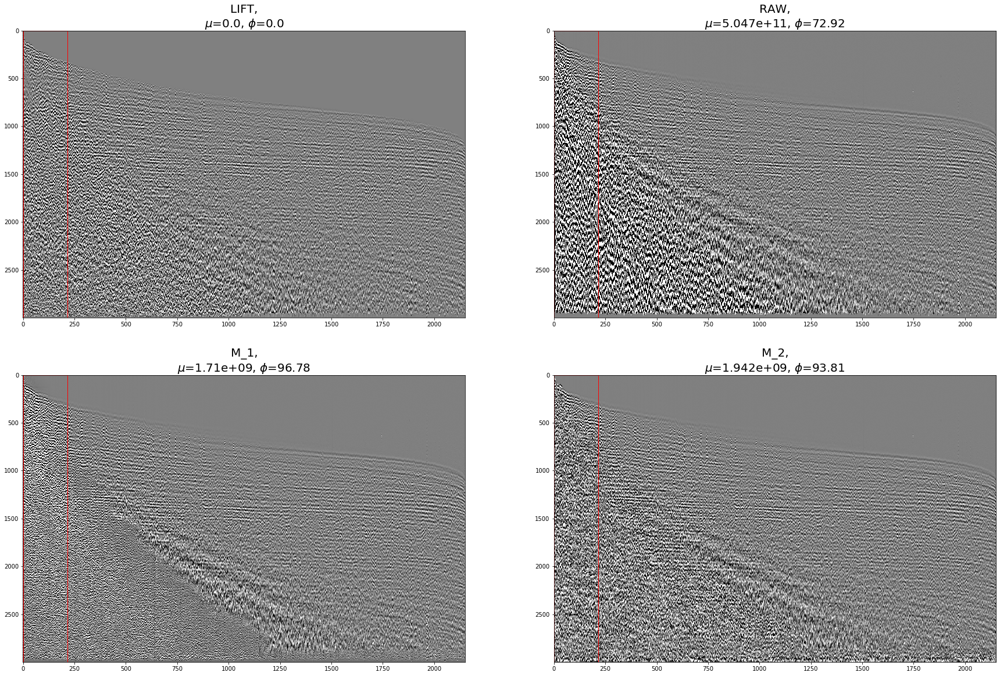

In [4]:
i=0
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

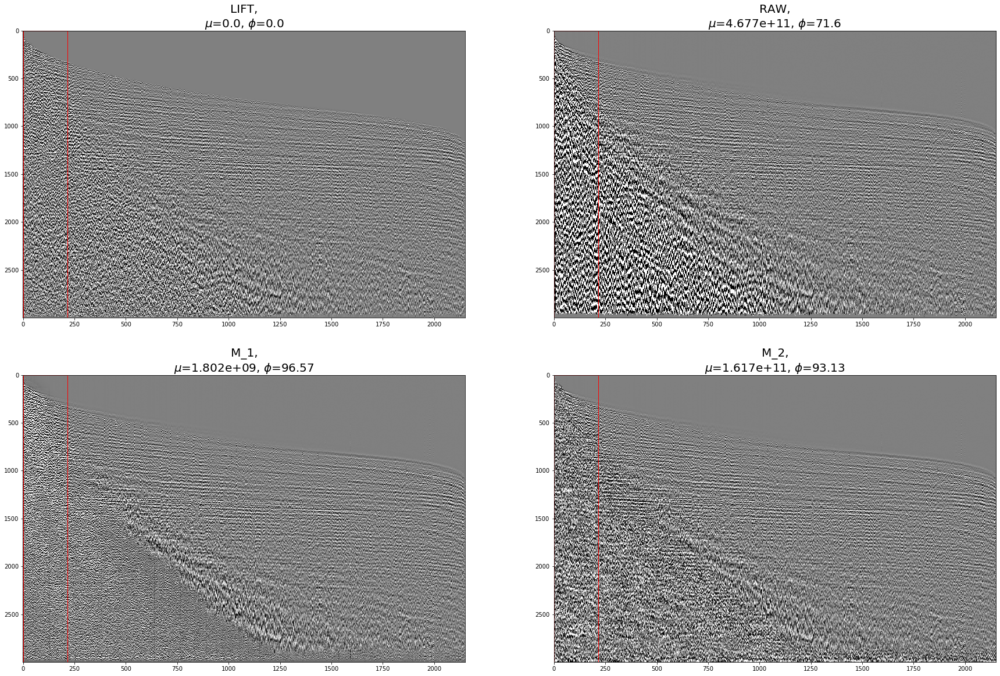

In [5]:
i=1
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

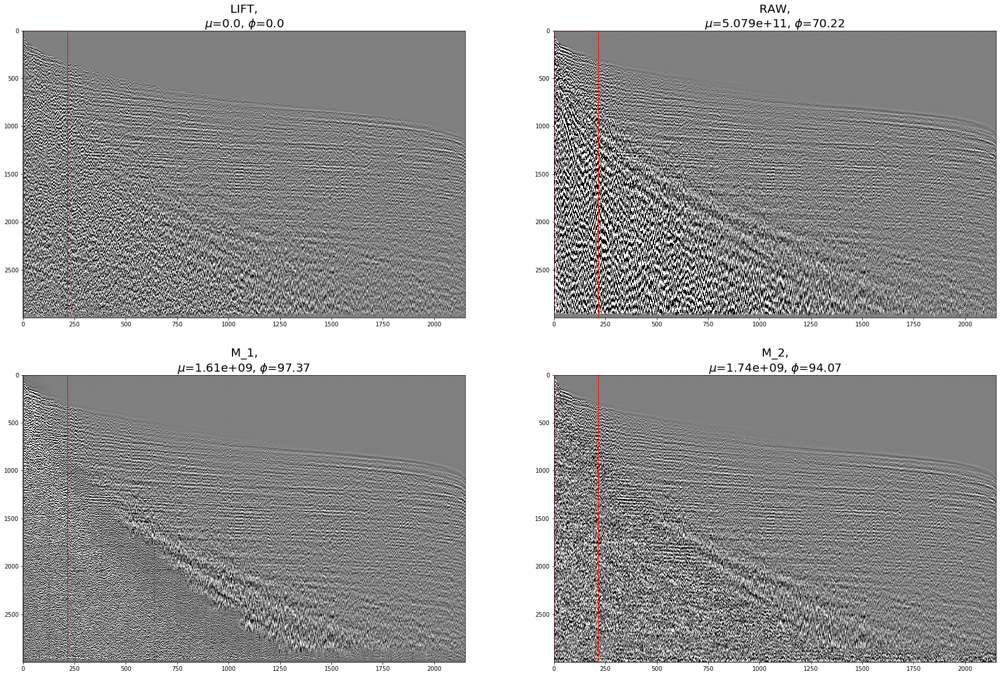

In [6]:
i=2
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

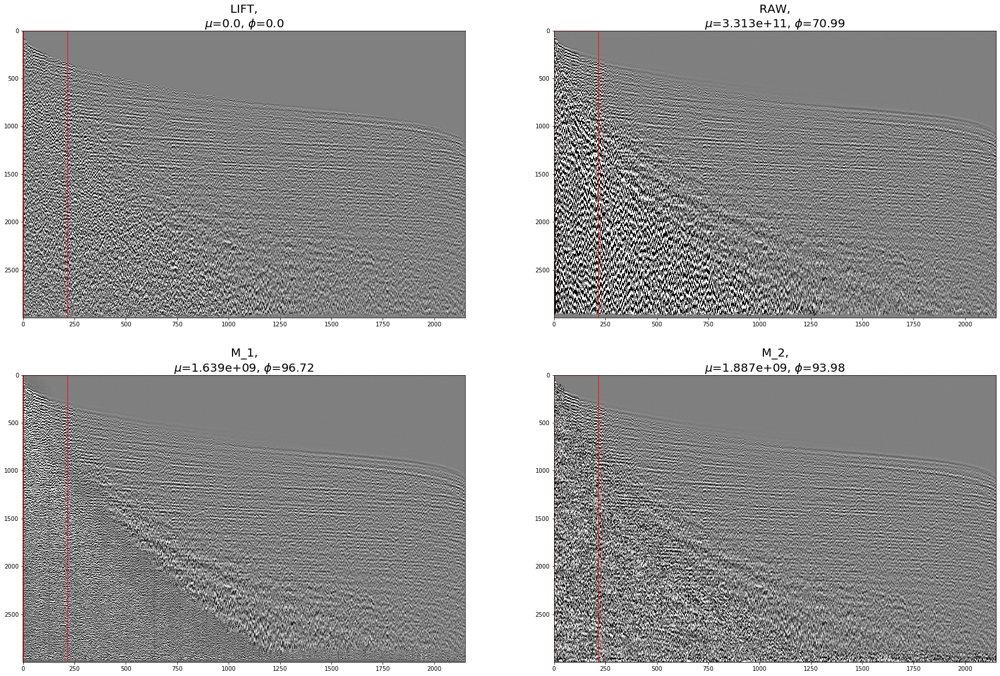

In [7]:
i=3
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')

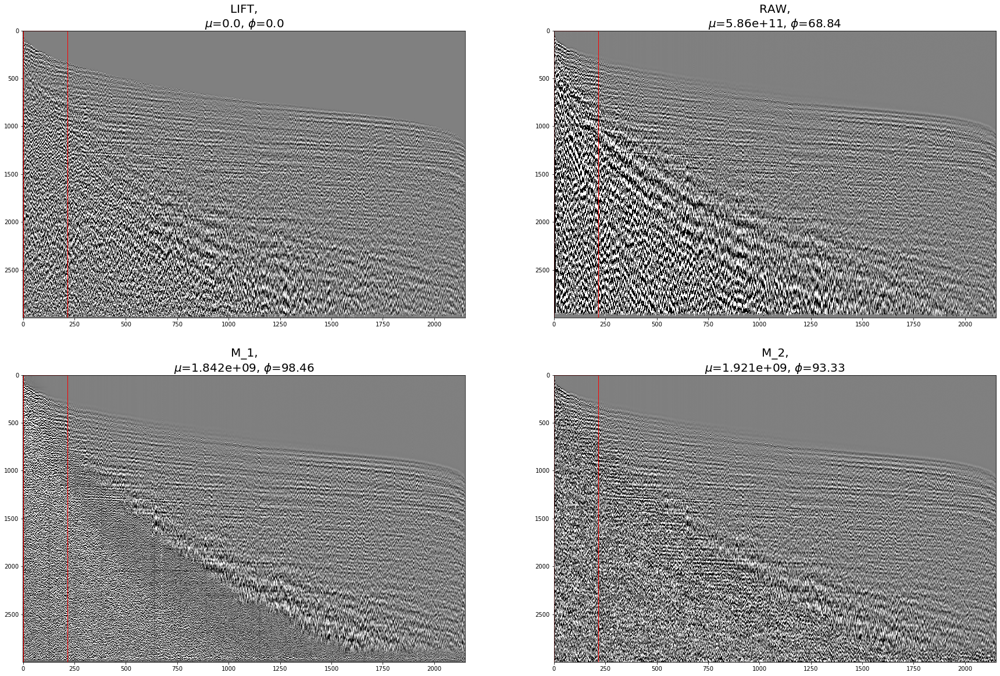

In [8]:
i=4
draw_modifications_dist(get_modifications_list(batch, i), vmin=-cv, vmax=cv,  figsize=(30, 20), n_cols=n_cols, aspect='auto')